# Data Engineering EDA Project

By Aommy, Austin, Ling, Tath (yippee)

-----------------------

#### DuckDB dependencies

In [2]:
!pip uninstall --quiet --yes malloy
!pip install --quiet --upgrade duckdb
!pip install --quiet jupysql==0.10.12
!pip install --quiet duckdb-engine

## Importing libraries

In [3]:
!pip install --quiet yfinance --upgrade --no-cache-dir

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import yfinance as yf
from scipy.stats import pearsonr

import io
from urllib.request import urlopen
import zipfile
import os

In [ ]:
! pip install plotly --quiet
! pip install pyarrow --quiet

import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.express as px

In [3]:
companies = {
    "tech": ['AAPL', 'MSFT', 'NVDA'],
    "energy": ['XOM', 'CVX', 'BP', 'COP'],
    "food": ['KO', 'PEP', 'PG'],
    "health": ['JNJ', 'PFE', 'ABBV'],
    "finance": ['JPM', 'V', 'MA'],
    "agriculture": ['DE', 'CTVA', 'ADM'],
    "telecom": ['T', 'VZ', 'TMUS'],
    "materials": ['DOW', 'NEM', 'FCX']
}

----------------------

## Data Analysis

In [8]:
import duckdb as ddb

In [9]:
! pip install pyarrow --quiet
%load_ext sql

There's a new jupysql version available (0.10.14), you're running 0.10.12. To upgrade: pip install jupysql --upgrade
Deploy FastAPI apps for free on Ploomber Cloud! Learn more: https://ploomber.io/s/signup


In [10]:
# %sql ROLLBACK

In [11]:
%config SqlMagic.autopandas = True
%config SqlMagic.feedback = False
%config SqlMagic.displaycon = False

In [48]:
%sql duckdb:///eda-ddb/eda-gdelt.ddb

In [64]:
%%sql
-- INSTALL httpfs;
-- LOAD httpfs;
-- SET s3_region='sgp-1';
-- SET s3_url_style='path';
-- SET s3_endpoint='https://dm-p1-eda.sgp1.digitaloceanspaces.com';
-- SET s3_access_key_id='DO004QXNR2KCXVUZG6DE' ;
-- SET s3_secret_access_key='4LgZ8LGSbbmJ7WAmLvsYVPsDGHfRoJpGatsEv4If8UU';

,Success


In [711]:
%%sql
duckdb:///eda-ddb/eda-yfinance.ddb
yfinance_data << SELECT * FROM 's3://eda-ddb/eda-yfinance.ddb'

RuntimeError: If using snippets, you may pass the --with argument explicitly.
For more details please refer: https://jupysql.ploomber.io/en/latest/compose.html#with-argument


Original error message from DB driver:
(duckdb.duckdb.CatalogException) Catalog Error: Table with name s3://eda-yfinance.ddb does not exist!
Did you mean "pg_namespace"?
LINE 1: SELECT * FROM 's3://eda-yfinance.ddb'
                      ^
[SQL: SELECT * FROM 's3://eda-yfinance.ddb']
(Background on this error at: https://sqlalche.me/e/20/f405)

If you need help solving this issue, send us a message: https://ploomber.io/community


In [ ]:
%sql duckdb:///eda-ddb/eda-gdelt.ddb

In [41]:
%sql SELECT count(*) from gdelt

,count_star()
0,260658282


In [14]:
%sql SELECT * FROM gdelt LIMIT 3;

,GlobalEventID,Day,MonthYear,Year,FractionDate,Actor1Code,Actor1Name,Actor1CountryCode,Actor1KnownGroupCode,Actor2Code,...,NumSources,NumArticles,AvgTone,Actor1Geo_Type,Actor1Geo_CountryCode,Actor2Geo_Type,Actor2Geo_CountryCode,ActionGeo_Type,ActionGeo_CountryCode,SOURCEURL
0,813415774,20180101,201801,2018,2018.0027,None,None,None,None,AGR,...,6.0,45.0,-1.070367,0.0,None,4.0,CA,4.0,CA,https://www.weyburnreview.com/cn-rail-and-cp-r...
1,813415775,20180101,201801,2018,2018.0027,None,None,None,None,USA,...,1.0,8.0,-1.333333,0.0,None,3.0,US,3.0,US,http://www.startribune.com/arcelormittal-takes...
2,813415776,20180101,201801,2018,2018.0027,AGR,FARMER,None,None,None,...,3.0,15.0,-1.112403,4.0,CA,0.0,None,4.0,CA,https://www.weyburnreview.com/cn-rail-and-cp-r...


In [5]:
%%sql
-- ALTER TABLE gdelt DROP COLUMN DateAdded;
-- ALTER TABLE gdelt DROP COLUMN ActionGeo_Lat;
-- ALTER TABLE gdelt DROP COLUMN ActionGeo_Long;
-- ALTER TABLE gdelt DROP COLUMN ActionGeo_FeatureID;
-- ALTER TABLE gdelt DROP COLUMN ActionGeo_ADM1Code;
-- ALTER TABLE gdelt DROP COLUMN ActionGeo_Fullname;
-- ALTER TABLE gdelt DROP COLUMN Actor2Geo_ADM1Code;
-- ALTER TABLE gdelt DROP COLUMN Actor2Geo_Lat;
-- ALTER TABLE gdelt DROP COLUMN Actor2Geo_Long;
-- ALTER TABLE gdelt DROP COLUMN Actor2Geo_FeatureID;
-- ALTER TABLE gdelt DROP COLUMN Actor2Geo_Fullname;
-- ALTER TABLE gdelt DROP COLUMN Actor1Geo_ADM1Code;
-- ALTER TABLE gdelt DROP COLUMN Actor1Geo_Lat;
-- ALTER TABLE gdelt DROP COLUMN Actor1Geo_Long;
-- ALTER TABLE gdelt DROP COLUMN Actor1Geo_FeatureID;
-- ALTER TABLE gdelt DROP COLUMN Actor1Geo_Fullname;
-- ALTER TABLE gdelt DROP COLUMN Actor1EthnicCode;
-- ALTER TABLE gdelt DROP COLUMN Actor2EthnicCode;
-- ALTER TABLE gdelt DROP COLUMN Actor1Religion1Code;
-- ALTER TABLE gdelt DROP COLUMN Actor1Religion2Code;
-- ALTER TABLE gdelt DROP COLUMN Actor2Religion1Code;
-- ALTER TABLE gdelt DROP COLUMN Actor2Religion2Code;
-- ALTER TABLE gdelt DROP COLUMN Actor1Type1Code;
-- ALTER TABLE gdelt DROP COLUMN Actor1Type2Code;
-- ALTER TABLE gdelt DROP COLUMN Actor1Type3Code;
-- ALTER TABLE gdelt DROP COLUMN Actor2Type1Code;
-- ALTER TABLE gdelt DROP COLUMN Actor2Type2Code;
-- ALTER TABLE gdelt DROP COLUMN Actor2Type3Code;

UsageError: Cell magic `%%sql` not found.


In [81]:
%%sql
select *
from INFORMATION_SCHEMA.COLUMNS
where TABLE_NAME='gdelt'

,table_catalog,table_schema,table_name,column_name,ordinal_position,column_default,is_nullable,data_type,character_maximum_length,character_octet_length,...,identity_generation,identity_start,identity_increment,identity_maximum,identity_minimum,identity_cycle,is_generated,generation_expression,is_updatable,COLUMN_COMMENT
0,eda-gdelt,main,gdelt,GlobalEventID,1,None,YES,BIGINT,NaN,NaN,...,None,None,None,None,None,NaN,None,None,NaN,None
1,eda-gdelt,main,gdelt,Day,2,None,YES,BIGINT,NaN,NaN,...,None,None,None,None,None,NaN,None,None,NaN,None
2,eda-gdelt,main,gdelt,MonthYear,3,None,YES,BIGINT,NaN,NaN,...,None,None,None,None,None,NaN,None,None,NaN,None
3,eda-gdelt,main,gdelt,Year,4,None,YES,BIGINT,NaN,NaN,...,None,None,None,None,None,NaN,None,None,NaN,None
4,eda-gdelt,main,gdelt,FractionDate,5,None,YES,DOUBLE,NaN,NaN,...,None,None,None,None,None,NaN,None,None,NaN,None
5,eda-gdelt,main,gdelt,Actor1Code,6,None,YES,VARCHAR,NaN,NaN,...,None,None,None,None,None,NaN,None,None,NaN,None
6,eda-gdelt,main,gdelt,Actor1Name,7,None,YES,VARCHAR,NaN,NaN,...,None,None,None,None,None,NaN,None,None,NaN,None
7,eda-gdelt,main,gdelt,Actor1CountryCode,8,None,YES,VARCHAR,NaN,NaN,...,None,None,None,None,None,NaN,None,None,NaN,None
8,eda-gdelt,main,gdelt,Actor1KnownGroupCode,9,None,YES,VARCHAR,NaN,NaN,...,None,None,None,None,None,NaN,None,None,NaN,None
9,eda-gdelt,main,gdelt,Actor2Code,10,None,YES,VARCHAR,NaN,NaN,...,None,None,None,None,None,NaN,None,None,NaN,None


## Question 3 -- How did news regarding COVID impact the stock market?

$H_0$: Negative news regarding COVID did not impact the closing stock price

$H_A$: Negative news regarding COVID did impact the closing price.

In [343]:
%%sql

covid_events << SELECT * FROM gdelt WHERE SOURCEURL like '%covid%' AND NumMentions > 100

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

In [344]:
covid_events['Day'] = pd.to_datetime(covid_events['Day'], format='%Y%m%d')

In [345]:
covid_events

,GlobalEventID,Day,MonthYear,Year,FractionDate,Actor1Code,Actor1Name,Actor1CountryCode,Actor1KnownGroupCode,Actor2Code,...,NumSources,NumArticles,AvgTone,Actor1Geo_Type,Actor1Geo_CountryCode,Actor2Geo_Type,Actor2Geo_CountryCode,ActionGeo_Type,ActionGeo_CountryCode,SOURCEURL
0,905330340,2020-02-12,202002,2020,2020.1151,None,None,None,None,CVL,...,10.0,130.0,-6.545134,0.0,None,1.0,AS,1.0,AS,https://newsinfo.inquirer.net/1227511/who-name...
1,905330341,2020-02-12,202002,2020,2020.1151,None,None,None,None,CVL,...,10.0,130.0,-6.545134,0.0,None,1.0,AS,1.0,AS,https://newsinfo.inquirer.net/1227511/who-name...
2,905331289,2020-02-12,202002,2020,2020.1151,CHE,GENEVA,CHE,None,CVL,...,19.0,208.0,-6.402461,4.0,SZ,4.0,SZ,4.0,SZ,https://newsinfo.inquirer.net/1227511/who-name...
3,905331296,2020-02-12,202002,2020,2020.1151,CHN,CHINA,CHN,None,None,...,92.0,920.0,-3.735327,4.0,SZ,0.0,None,4.0,SZ,https://www.shanghaisun.com/news/263995219/nov...
4,905331310,2020-02-12,202002,2020,2020.1151,CHN,WUHAN,CHN,None,None,...,38.0,282.0,-4.352761,4.0,CH,0.0,None,4.0,CH,https://newsinfo.inquirer.net/1227511/who-name...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96059,1203208179,2024-10-10,202410,2024,2024.7671,RUS,RUSSIA,RUS,None,None,...,39.0,200.0,-1.668654,4.0,RS,0.0,None,4.0,RS,https://www.nbclosangeles.com/news/national-in...
96060,1203444544,2024-10-11,202410,2024,2024.7699,IND,KARNATAKA,IND,None,None,...,13.0,165.0,3.868325,0.0,None,0.0,None,0.0,None,https://www.ndtv.com/india-news/karnataka-cabi...
96061,1203604052,2024-10-11,202410,2024,2024.7699,None,None,None,None,USA,...,12.0,108.0,-5.557537,0.0,None,2.0,US,2.0,US,https://www.foxnews.com/politics/top-republica...
96062,1203911710,2024-10-14,202410,2024,2024.7781,HLH,DOCTOR,None,None,None,...,124.0,2715.0,0.148990,0.0,None,0.0,None,0.0,None,https://www.unionleader.com/news/health/study-...


Only querying for events that occur before 2019, since there are some events that are dated pre-2019.

In [346]:
covid_events = covid_events[covid_events["FractionDate"]> 2019]

In [122]:
covid_grpby_date = covid_events.groupby(["Day"])["NumArticles"].sum()
covid_grpby_date

Day
2019-03-03     268.0
2019-03-15    1364.0
2019-03-19     515.0
2019-03-21     420.0
2019-03-24     850.0
               ...  
2024-10-08    1063.0
2024-10-09    2079.0
2024-10-10     200.0
2024-10-11     273.0
2024-10-14    3119.0
Name: NumArticles, Length: 1740, dtype: float64

In [124]:
covid_grpby_date = covid_grpby_date.to_frame()

In [126]:
covid_grpby_date

,NumArticles
Day,
2019-03-03,268.0
2019-03-15,1364.0
2019-03-19,515.0
2019-03-21,420.0
2019-03-24,850.0
...,...
2024-10-08,1063.0
2024-10-09,2079.0
2024-10-10,200.0


Sum of no. articles grouped by day

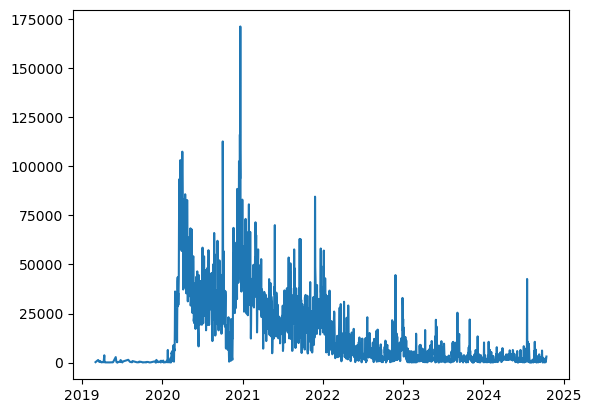

In [128]:
plt.plot(covid_grpby_date)

Sum of no. mentions grouped by day

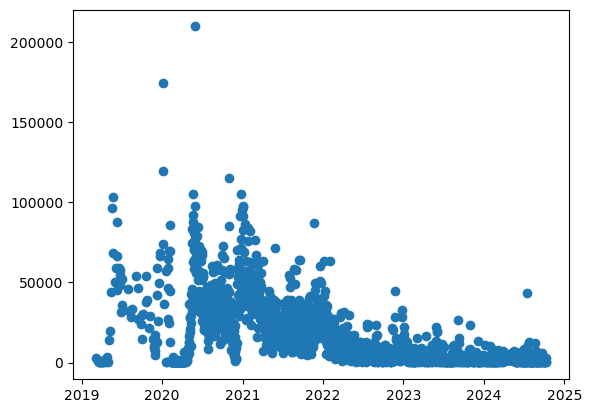

In [80]:
plt.scatter(covid_events["FractionDate"].unique(), covid_events.groupby(["FractionDate"])["NumMentions"].sum())

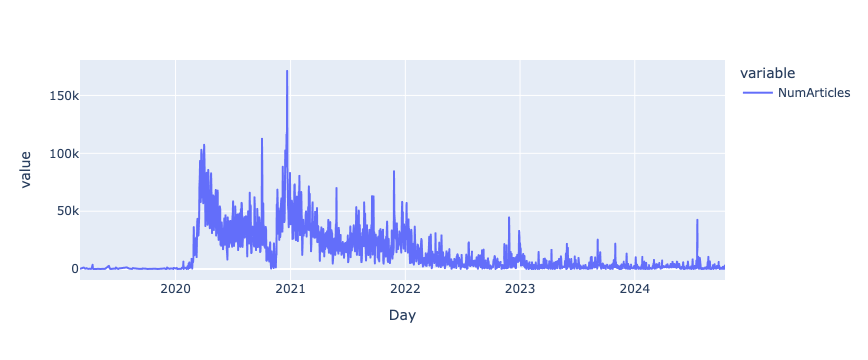

In [130]:
px.line(covid_grpby_date)

In [186]:
covid_avgtone_grpby_date = covid_events.groupby(["Day"])["AvgTone"].mean().to_frame()

In [188]:
covid_avgtone_grpby_date

,AvgTone
Day,
2019-03-03,-3.352114
2019-03-15,-5.813369
2019-03-19,-3.122548
2019-03-21,-3.777057
2019-03-24,-1.535265
...,...
2024-10-08,-1.926102
2024-10-09,-2.803531
2024-10-10,-1.668654


Plot closing price of each sector's stocks against the sum of number of articles grouped by day and coloured by average tone of each day

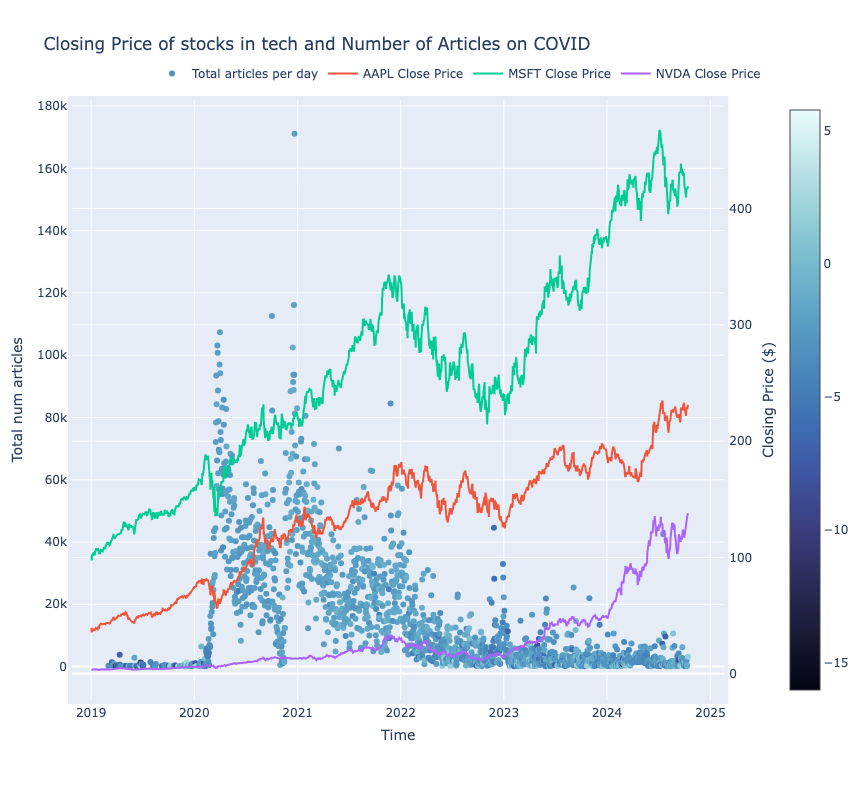

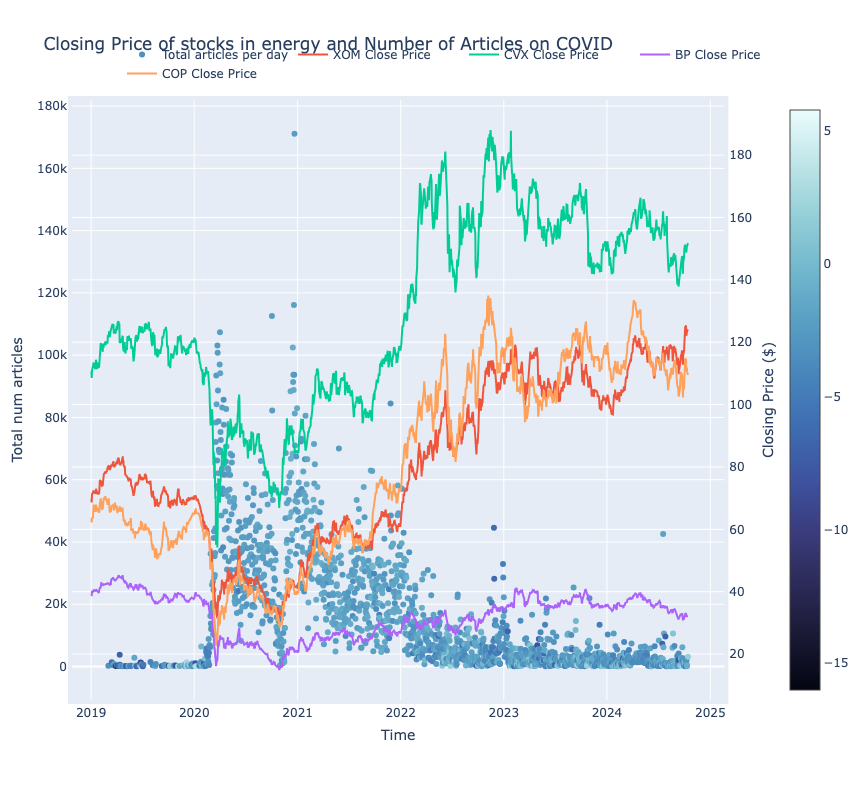

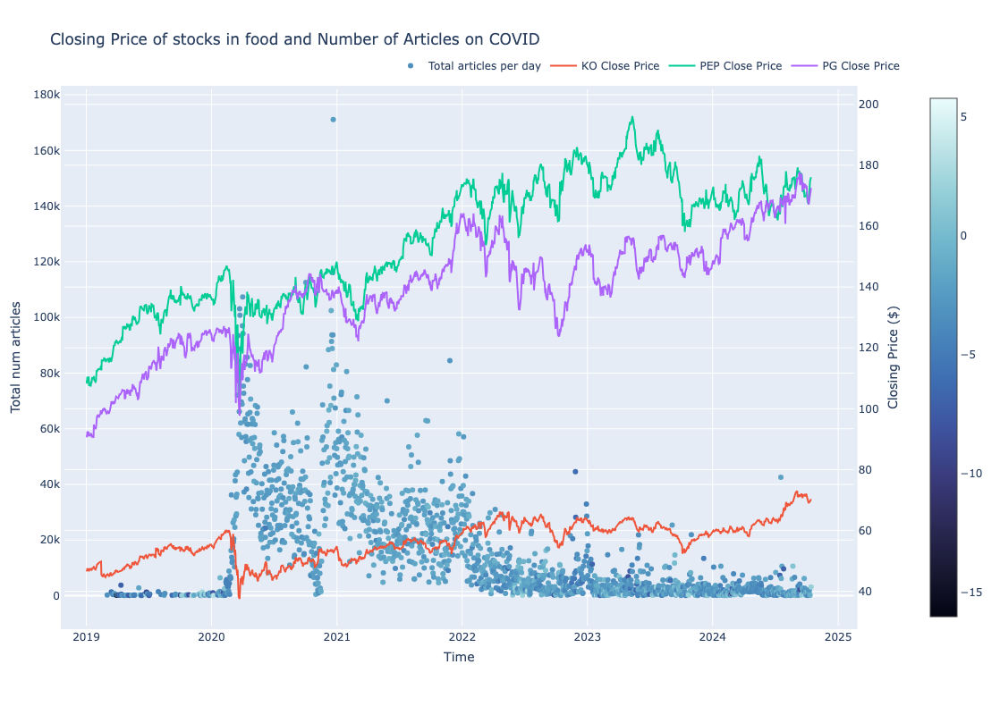

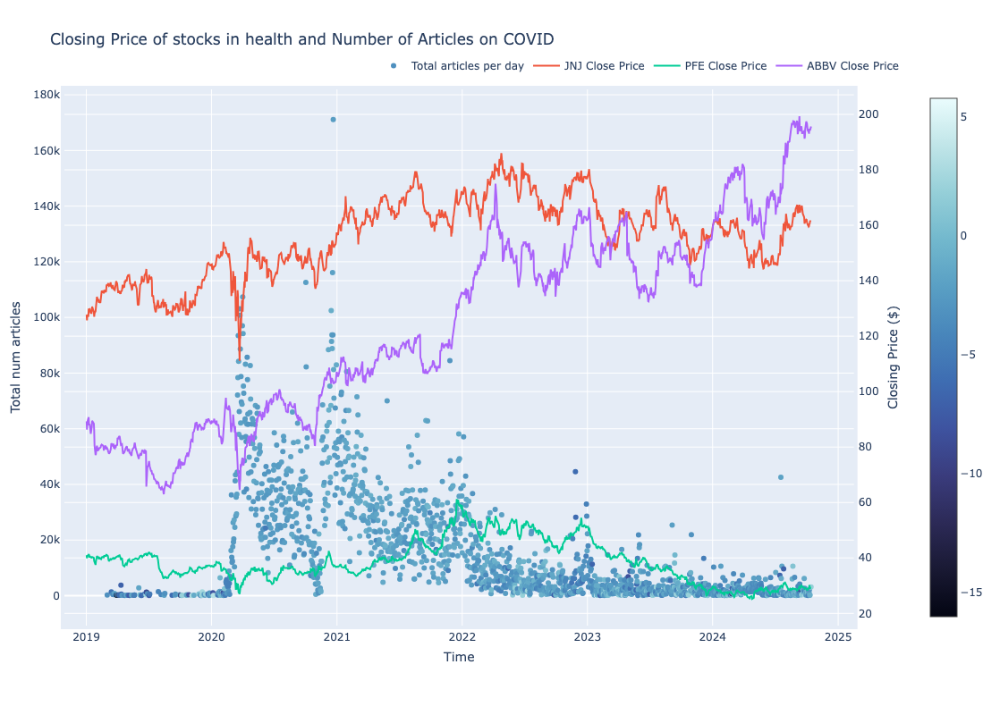

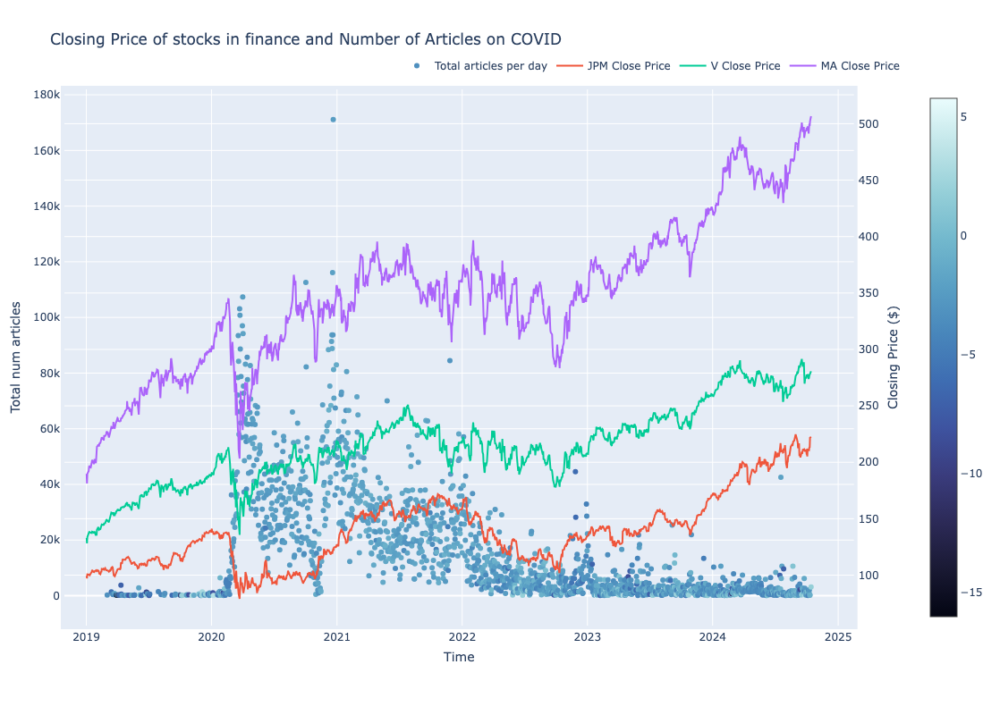

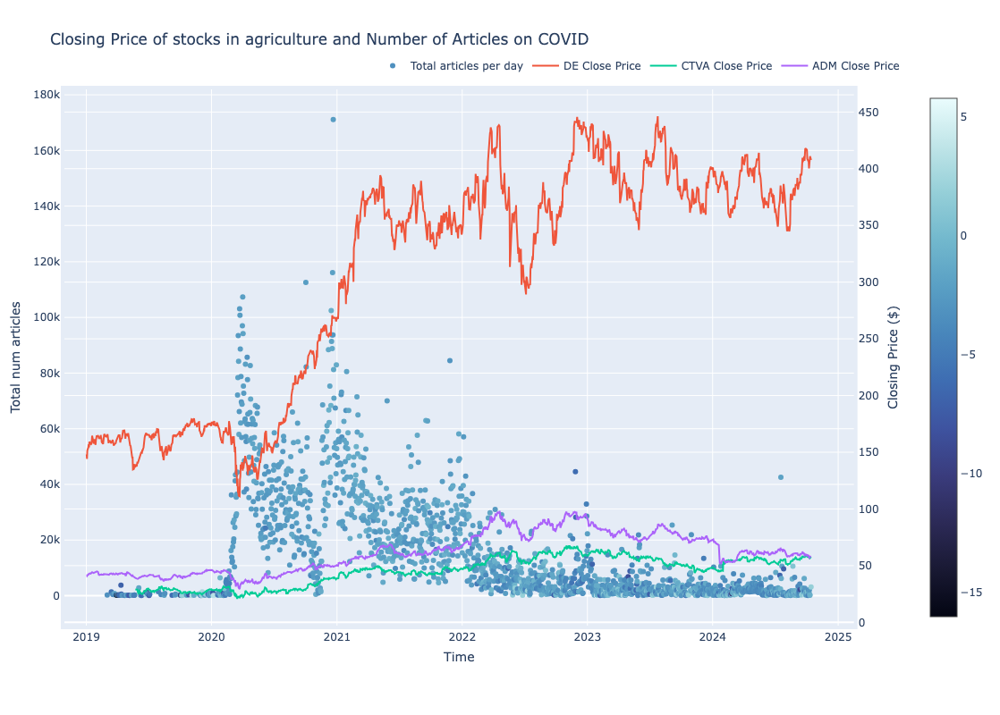

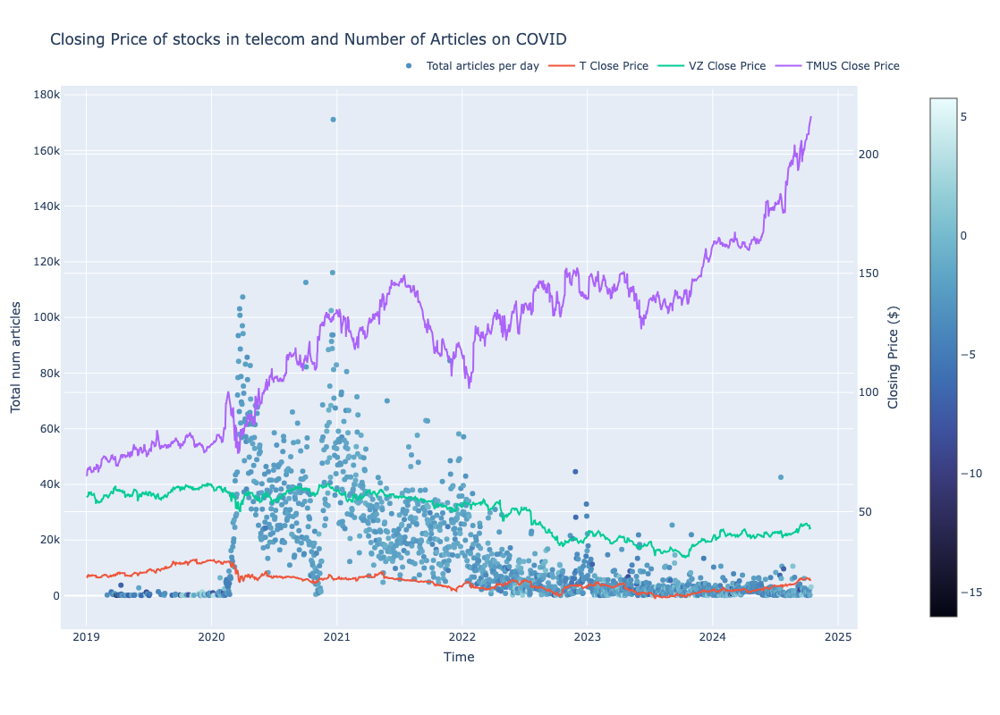

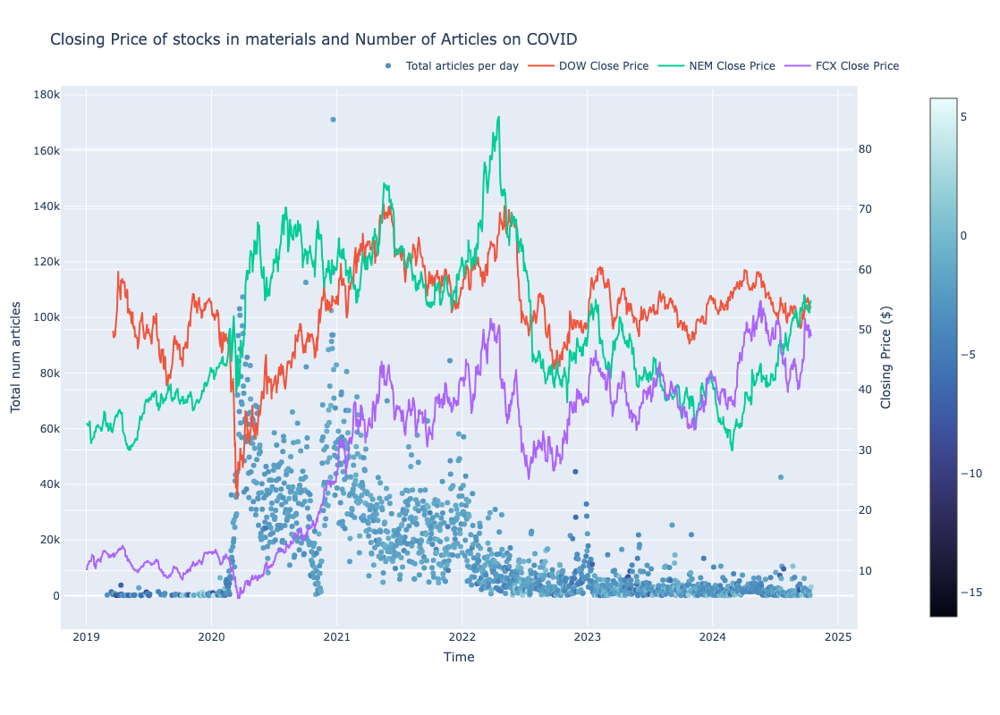

In [375]:
for sector in companies:
    fig = make_subplots(specs=[[{"secondary_y": True}]])
    
    fig.add_trace(
        go.Scatter(
            x = list(covid_grpby_date.index),
            y = covid_grpby_date["NumArticles"],
            mode='markers',
            marker=dict(color=covid_avgtone_grpby_date["AvgTone"], colorscale='Ice', showscale=True),
            name=f'Total articles per day'
        ),
        secondary_y=False
    )
    
    for stock in companies[sector]:
        fig.add_trace(
            go.Scatter(
                x = list(yfinance_data[yfinance_data["Stock"] == stock].sort_values(by=["Date"])["Date"]),
                y = yfinance_data[yfinance_data["Stock"] == stock].sort_values(by=["Date"])["Close"],
                name=f'{stock} Close Price',
            ),
            secondary_y=True
        )

    fig.update_yaxes(title_text="Closing Price ($)", secondary_y=True)
    fig.update_yaxes(title_text="Total num articles", secondary_y=False)
    
    # Update x-axis title and overall title
    fig.update_layout(
        autosize=False,
        width=1200,
        height=800,
        margin=dict(
            l=50,
            r=50,
            b=100,
            t=100,
            pad=4
        ),
        title_text=f'Closing Price of stocks in {sector} and Number of Articles on COVID',
        xaxis_title="Time",
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1
        )
    )
    # Show the plot
    fig.show()

Query only for negatively toned events per day

In [385]:
covid_negavgtone_grpby_date = covid_events[covid_events["AvgTone"] < 0].groupby(["Day"])["NumArticles"].sum()

In [387]:
covid_negavgtone_grpby_date

Day
2019-03-03     268.0
2019-03-15    1364.0
2019-03-19     515.0
2019-03-21     420.0
2019-03-24     850.0
               ...  
2024-10-07    1951.0
2024-10-08     809.0
2024-10-09    2079.0
2024-10-10     200.0
2024-10-11     108.0
Name: NumArticles, Length: 1695, dtype: float64

## From Jan 2020 -> Apr 2020, significant increase in negatively toned articles relating to COVID

Hence, we want to query only for events within that time frame.

In [408]:
%%sql

covid_events_jan_apr_2020 << SELECT * FROM gdelt WHERE (SOURCEURL like '%covid%' AND NumMentions > 100) AND (MonthYear >= 202001 AND MonthYear < 202005)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

In [409]:
covid_events_jan_apr_2020['Day'] = pd.to_datetime(covid_events_jan_apr_2020['Day'], format='%Y%m%d')

In [412]:
covid_events_jan_apr_2020

,GlobalEventID,Day,MonthYear,Year,FractionDate,Actor1Code,Actor1Name,Actor1CountryCode,Actor1KnownGroupCode,Actor2Code,...,NumSources,NumArticles,AvgTone,Actor1Geo_Type,Actor1Geo_CountryCode,Actor2Geo_Type,Actor2Geo_CountryCode,ActionGeo_Type,ActionGeo_CountryCode,SOURCEURL
0,905330340,2020-02-12,202002,2020,2020.1151,None,None,None,None,CVL,...,10.0,130.0,-6.545134,0.0,None,1.0,AS,1.0,AS,https://newsinfo.inquirer.net/1227511/who-name...
1,905330341,2020-02-12,202002,2020,2020.1151,None,None,None,None,CVL,...,10.0,130.0,-6.545134,0.0,None,1.0,AS,1.0,AS,https://newsinfo.inquirer.net/1227511/who-name...
2,905331289,2020-02-12,202002,2020,2020.1151,CHE,GENEVA,CHE,None,CVL,...,19.0,208.0,-6.402461,4.0,SZ,4.0,SZ,4.0,SZ,https://newsinfo.inquirer.net/1227511/who-name...
3,905331296,2020-02-12,202002,2020,2020.1151,CHN,CHINA,CHN,None,None,...,92.0,920.0,-3.735327,4.0,SZ,0.0,None,4.0,SZ,https://www.shanghaisun.com/news/263995219/nov...
4,905331310,2020-02-12,202002,2020,2020.1151,CHN,WUHAN,CHN,None,None,...,38.0,282.0,-4.352761,4.0,CH,0.0,None,4.0,CH,https://newsinfo.inquirer.net/1227511/who-name...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12508,981300118,2020-04-23,202004,2020,2020.3096,GOV,PRESIDENT,None,None,MARGOV,...,12.0,104.0,-1.621281,1.0,WI,1.0,WI,1.0,WI,https://lethbridgeherald.com/news/world-news/2...
12509,982116677,2020-04-28,202004,2020,2020.3233,EDU,STUDENT,None,None,None,...,30.0,118.0,-4.595752,4.0,IN,0.0,None,4.0,IN,https://www.nzherald.co.nz/world/covid-19-coro...
12510,982116678,2020-04-28,202004,2020,2020.3233,EDU,STUDENT,None,None,None,...,39.0,240.0,-4.525911,4.0,IN,0.0,None,4.0,IN,https://www.nzherald.co.nz/world/covid-19-coro...
12511,982270141,2020-04-28,202004,2020,2020.3233,GBRGOV,DOWNING STREET,GBR,None,GBR,...,52.0,104.0,-0.663589,4.0,UK,4.0,UK,4.0,UK,https://www.newsandstar.co.uk/news/national/19...


In [418]:
covid_negavgtone_grpby_date_janapr = covid_events_jan_apr_2020[covid_events_jan_apr_2020["AvgTone"] < 0].groupby(["Day"])["NumArticles"].sum()

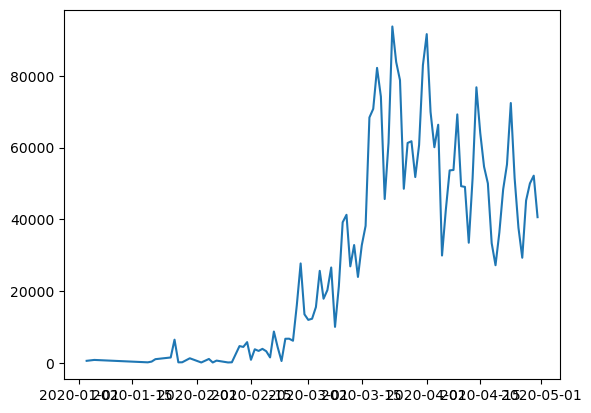

In [420]:
plt.plot(covid_negavgtone_grpby_date_janapr.index, covid_negavgtone_grpby_date_janapr)

Plot closing price of companies against the sum of no. articles that are negatively toned per day

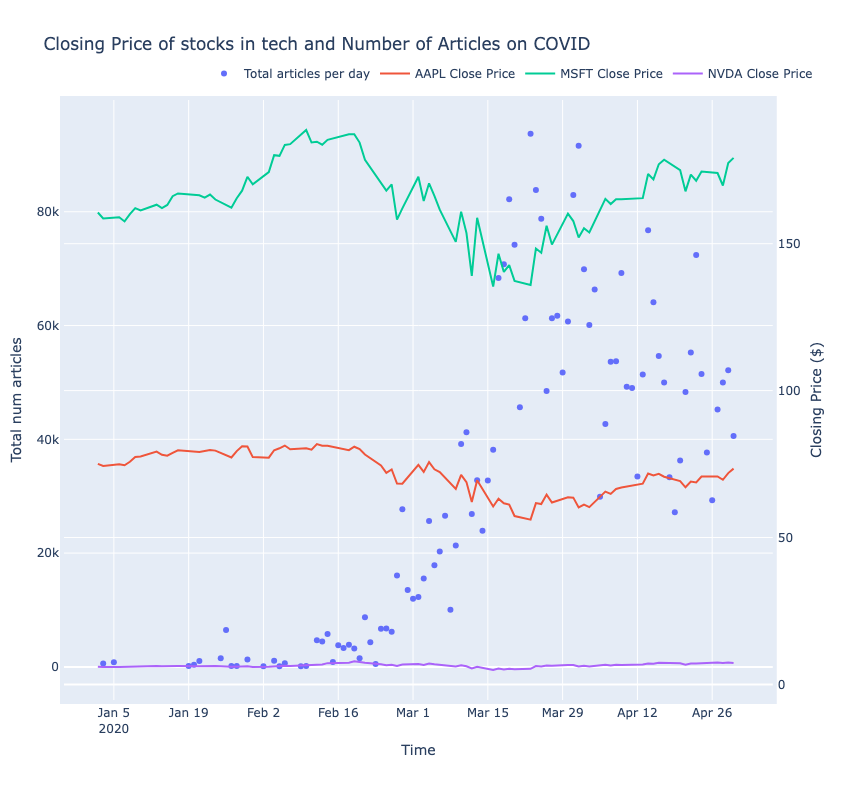

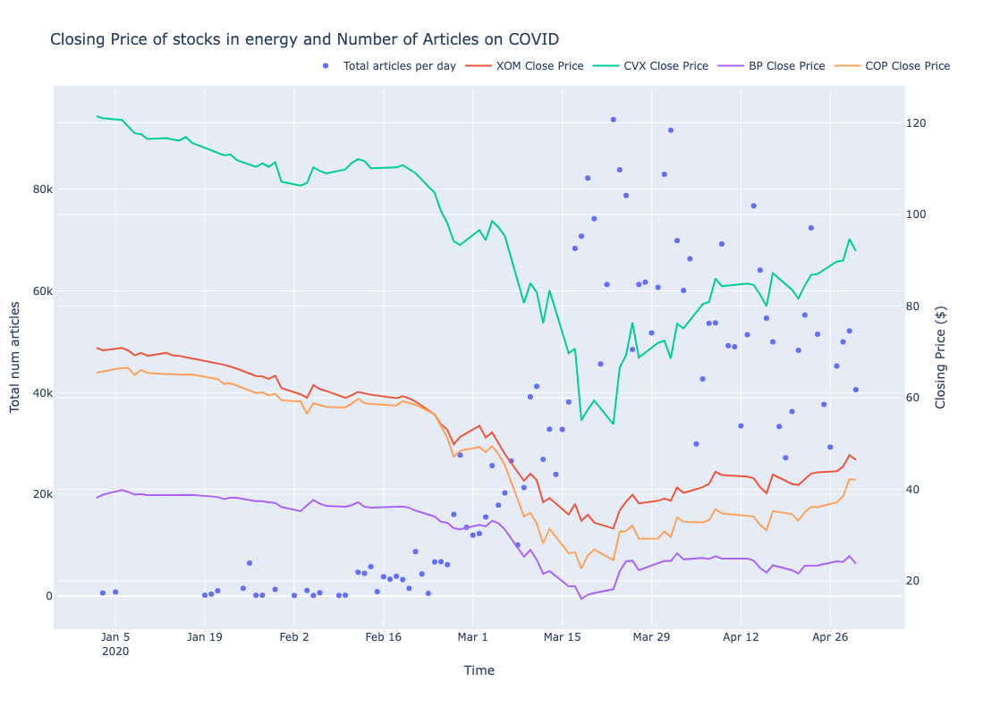

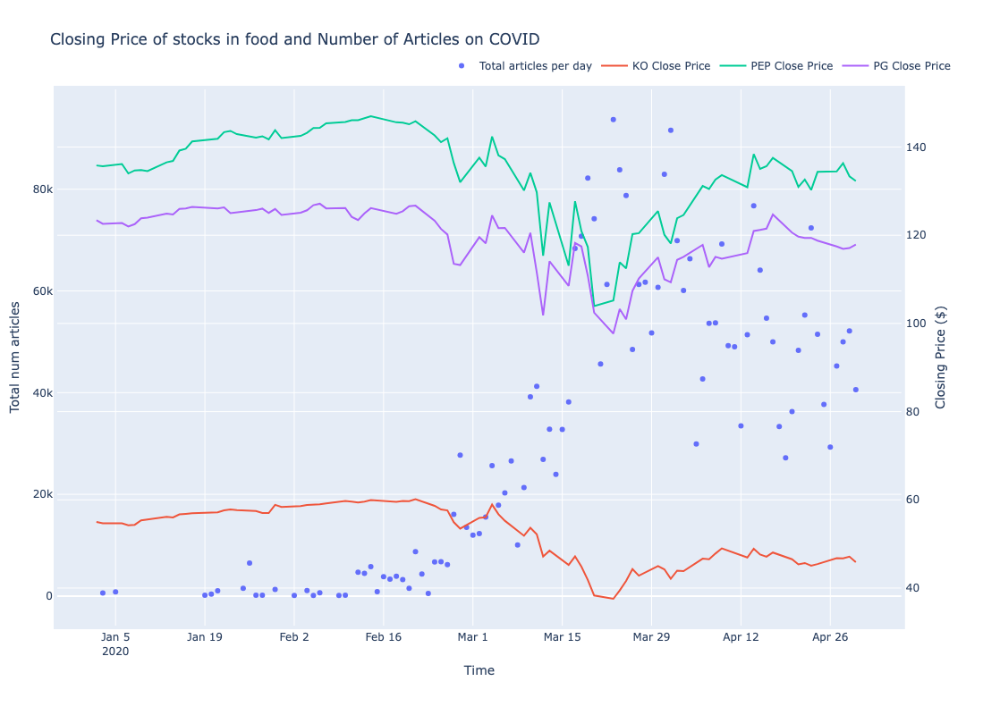

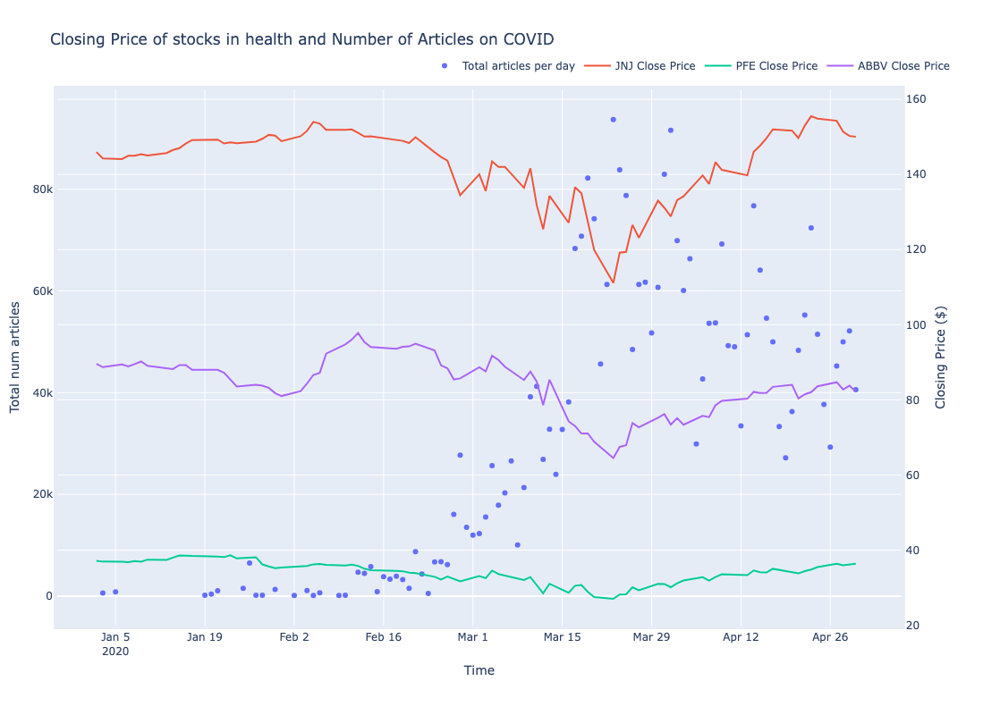

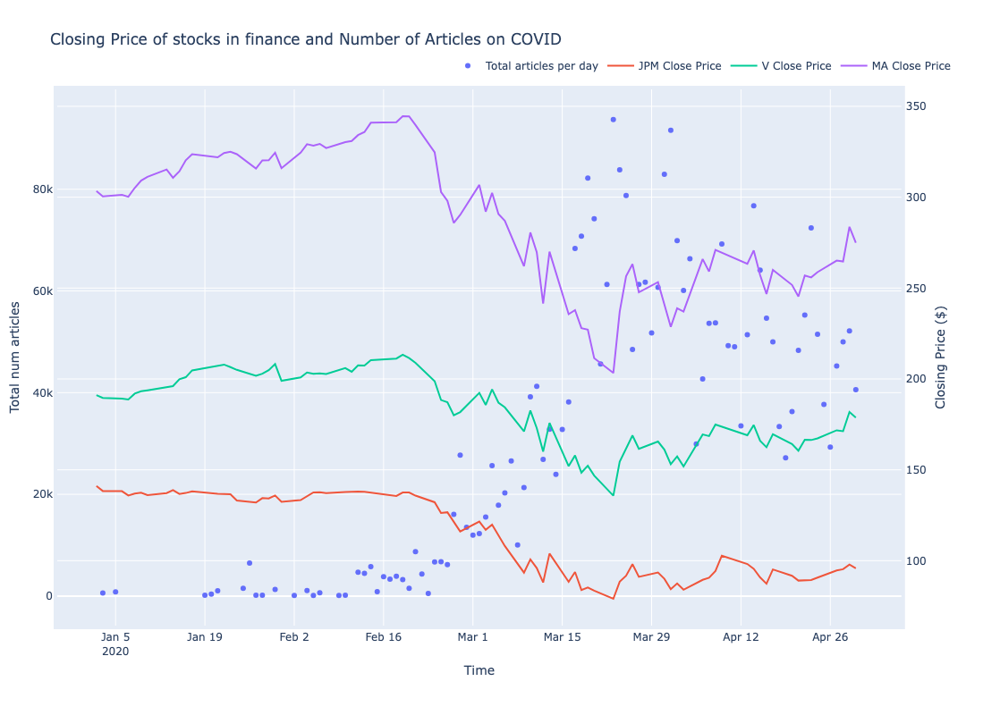

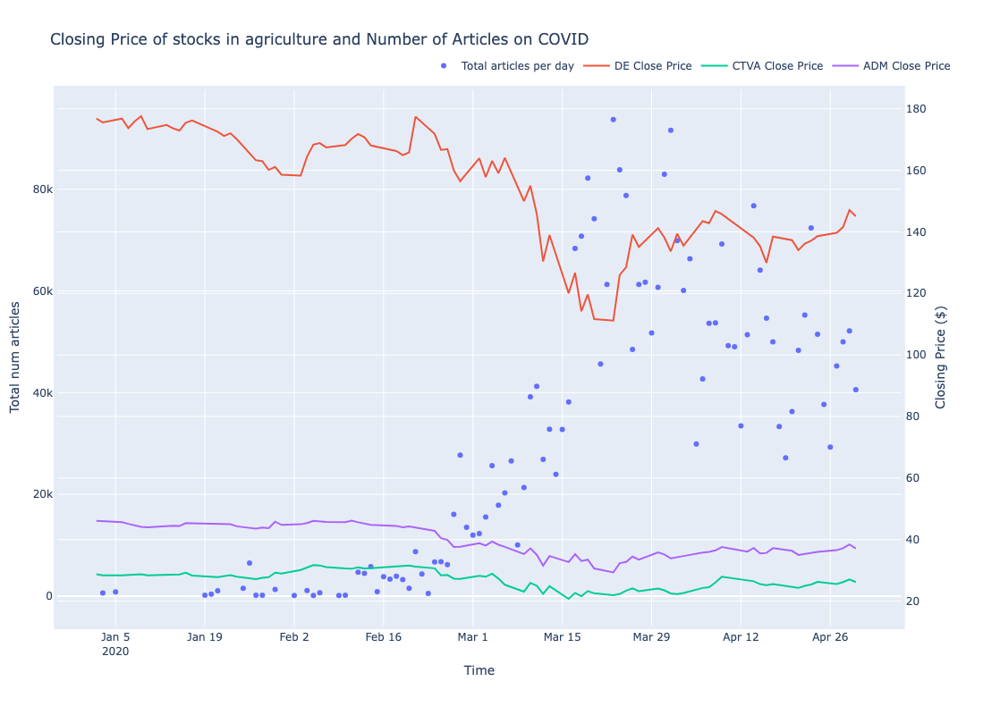

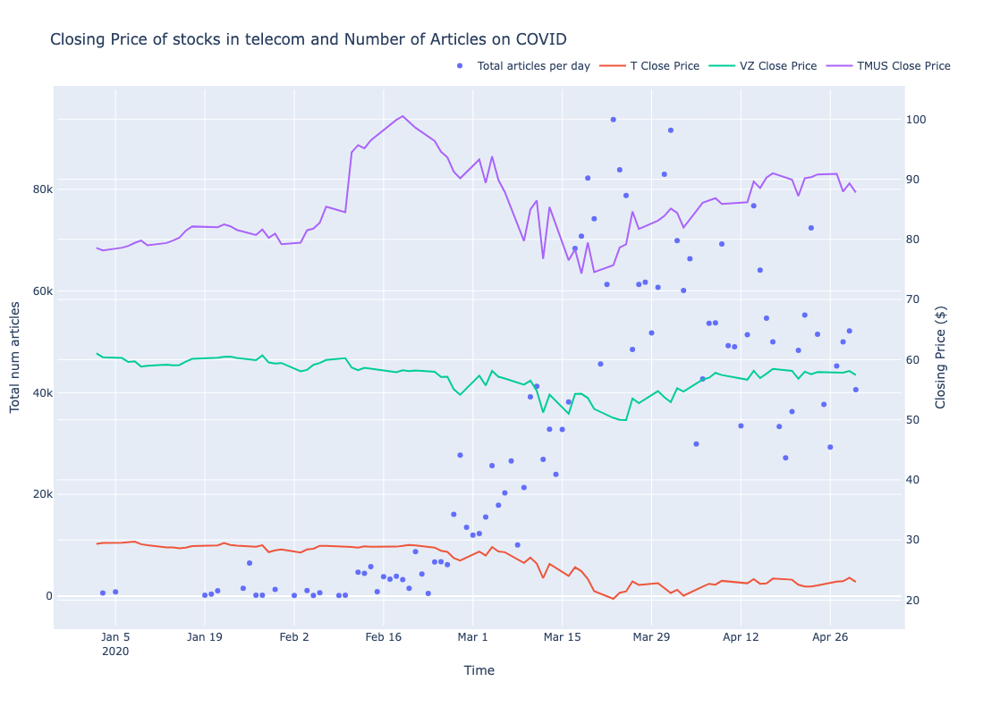

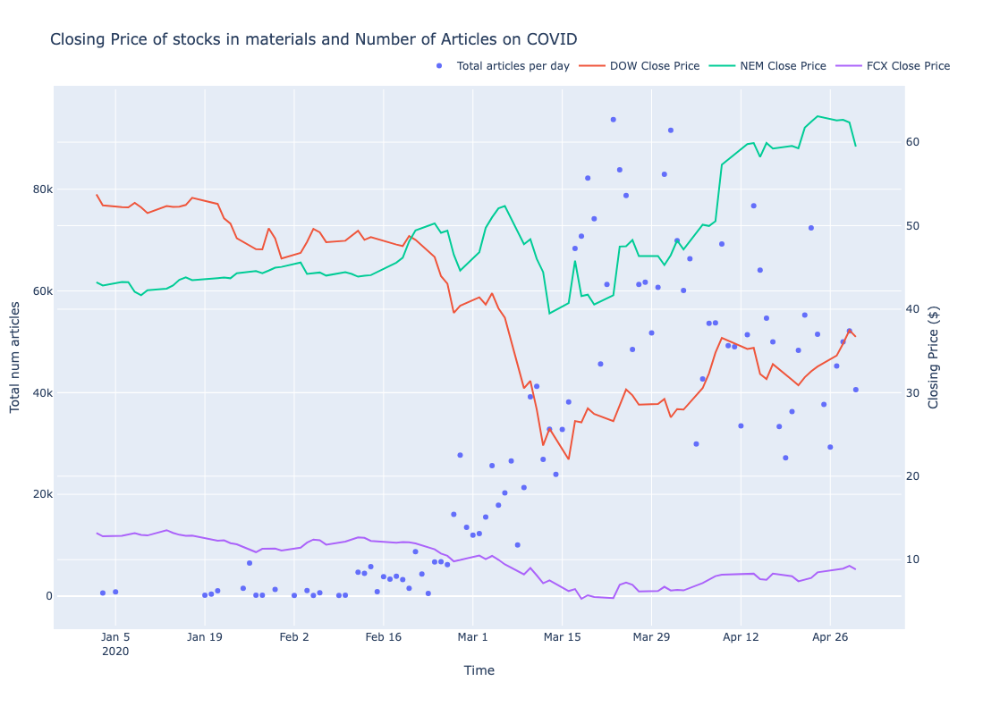

In [438]:
for sector in companies:
    fig = make_subplots(specs=[[{"secondary_y": True}]])
    
    fig.add_trace(
        go.Scatter(
            x = list(covid_negavgtone_grpby_date_janapr.index),
            y = covid_negavgtone_grpby_date_janapr,
            mode='markers',
            name=f'Total articles per day'
        ),
        secondary_y=False
    )

    df = yfinance_data[yfinance_data["Date"] >= '2020-01-01']
    df = df[df["Date"] < '2020-05-01']
    
    for stock in companies[sector]:
        fig.add_trace(
            go.Scatter(
                x = list(df[df["Stock"] == stock].sort_values(by=["Date"])["Date"]),
                y = df[df["Stock"] == stock].sort_values(by=["Date"])["Close"],
                name=f'{stock} Close Price',
            ),
            secondary_y=True
        )

    fig.update_yaxes(title_text="Closing Price ($)", secondary_y=True)
    fig.update_yaxes(title_text="Total num articles", secondary_y=False)
    
    # Update x-axis title and overall title
    fig.update_layout(
        autosize=False,
        width=800,
        height=800,
        margin=dict(
            l=50,
            r=50,
            b=100,
            t=100,
            pad=4
        ),
        title_text=f'Closing Price of stocks in {sector} and Number of Articles on COVID',
        xaxis_title="Time",
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1
        )
    )
    # Show the plot
    fig.show()

Calculate rolling average over 5 days for closing price and negatively toned no. article and find correlation.

[*********************100%***********************]  1 of 1 completed

R:  -0.9033105999255407 , p-value:  4.258110108639515e-24


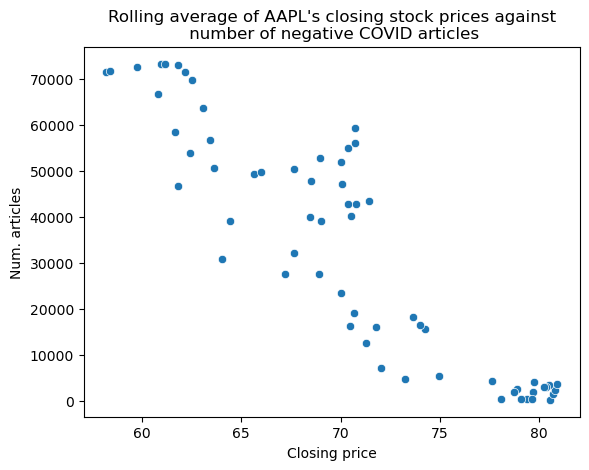

[*********************100%***********************]  1 of 1 completed


R:  -0.6390597842488667 , p-value:  1.7353480654492804e-08


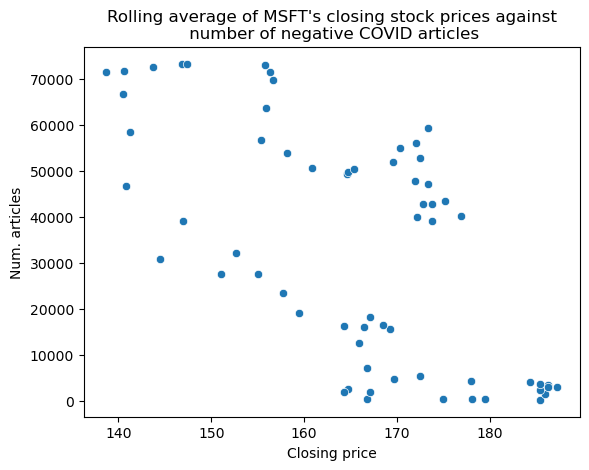

[*********************100%***********************]  1 of 1 completed

R:  -0.27612112761099245 , p-value:  0.02848544210815212


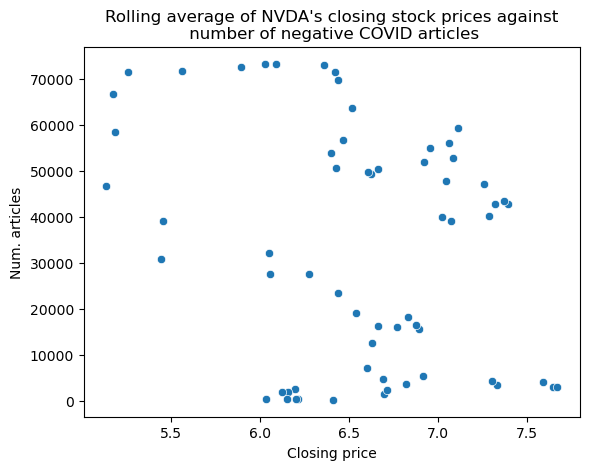

[*********************100%***********************]  1 of 1 completed


R:  -0.9185209403771385 , p-value:  2.8874918352357707e-26


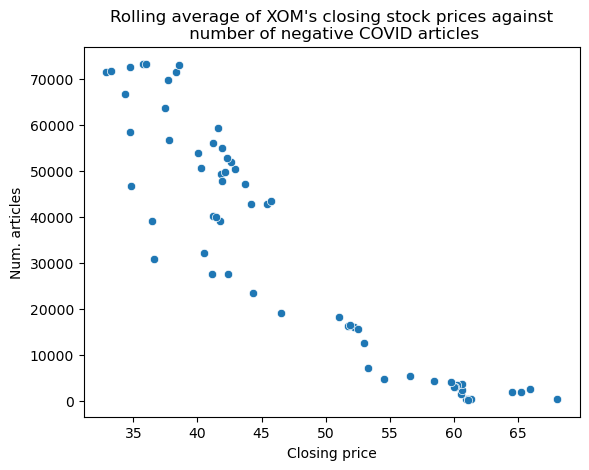

[*********************100%***********************]  1 of 1 completed


R:  -0.9269480722242274 , p-value:  1.171167908552525e-27


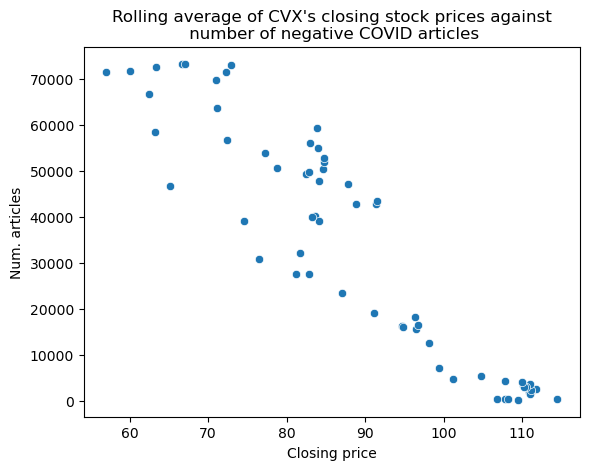

[*********************100%***********************]  1 of 1 completed


R:  -0.8995713015513559 , p-value:  1.2808808891986458e-23


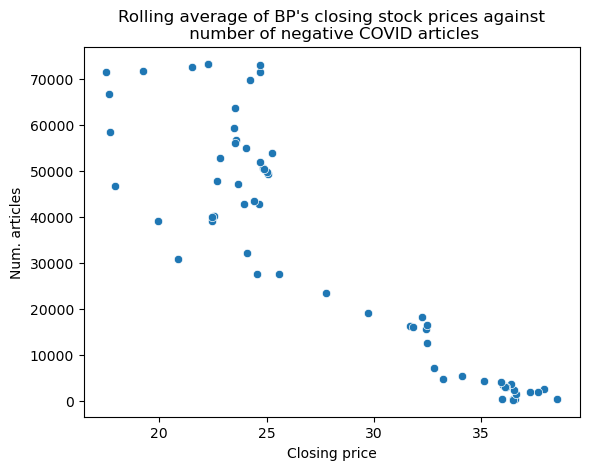

[*********************100%***********************]  1 of 1 completed


R:  -0.9191013521971412 , p-value:  2.3419012132543395e-26


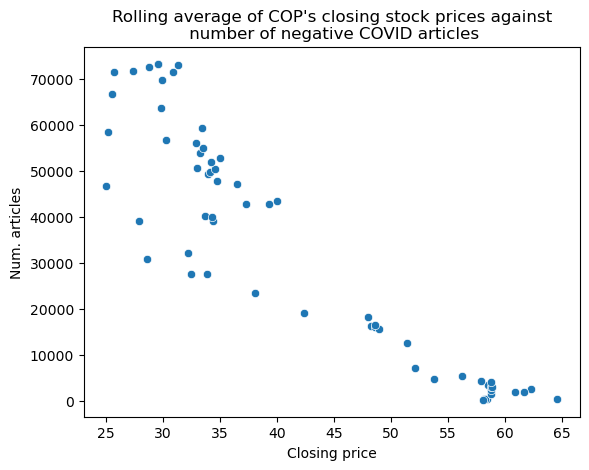

[*********************100%***********************]  1 of 1 completed

R:  -0.9689186121381002 , p-value:  1.037454079359259e-38


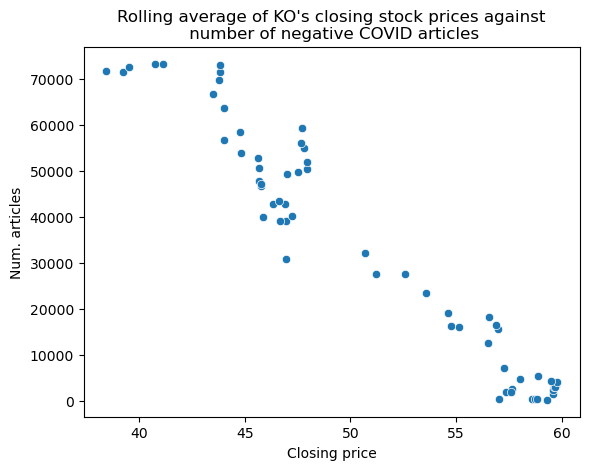

[*********************100%***********************]  1 of 1 completed

R:  -0.8634499942801266 , p-value:  8.71011762496227e-20


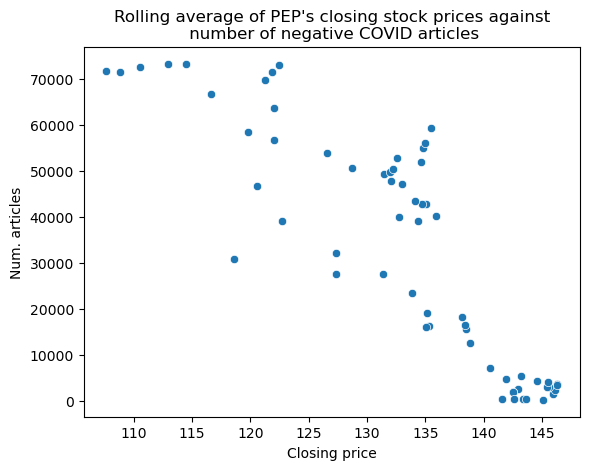

[*********************100%***********************]  1 of 1 completed

R:  -0.8124126242483714 , p-value:  6.364818182250522e-16


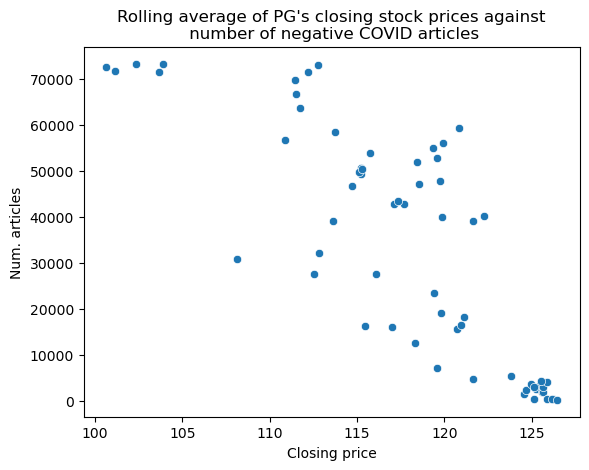

[*********************100%***********************]  1 of 1 completed


R:  -0.6360562851122478 , p-value:  2.1220776494232224e-08


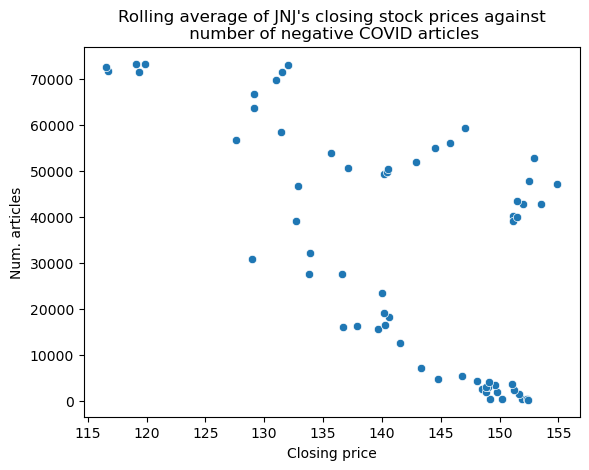

[*********************100%***********************]  1 of 1 completed

R:  -0.6543333837935539 , p-value:  6.025220466861458e-09


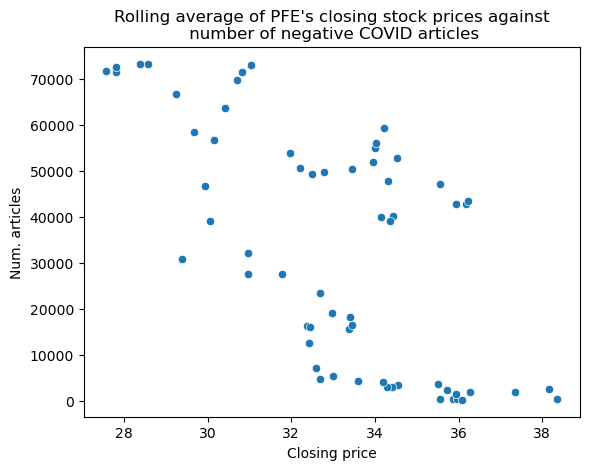

[*********************100%***********************]  1 of 1 completed


R:  -0.8664374783995427 , p-value:  4.6428865395494797e-20


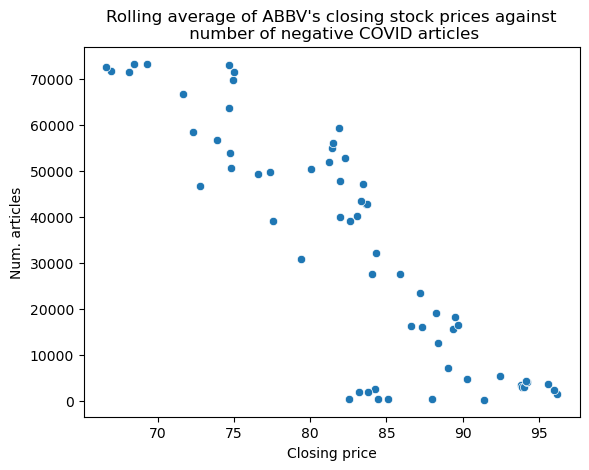

[*********************100%***********************]  1 of 1 completed


R:  -0.9291973591630921 , p-value:  4.664443381329804e-28


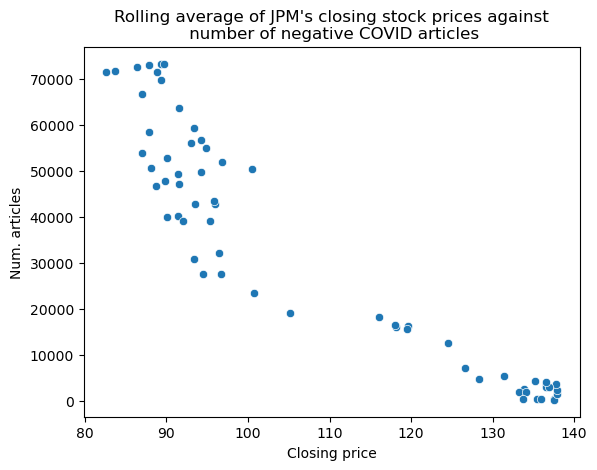

[*********************100%***********************]  1 of 1 completed

R:  -0.9351974902173832 , p-value:  3.422007986580948e-29


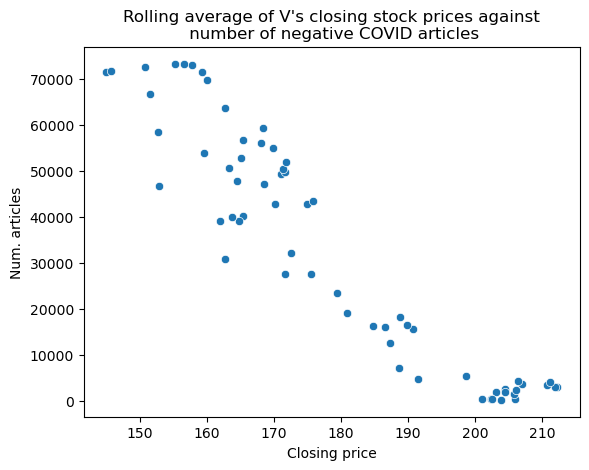

[*********************100%***********************]  1 of 1 completed

R:  -0.9323131099603141 , p-value:  1.2378128737672875e-28


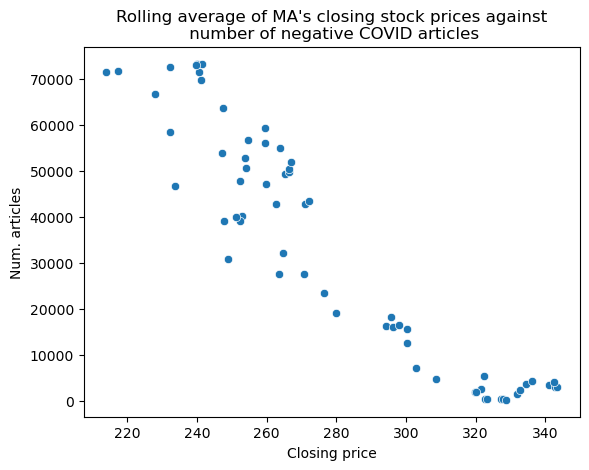

[*********************100%***********************]  1 of 1 completed


R:  -0.9145699744868216 , p-value:  1.1540765067978007e-25


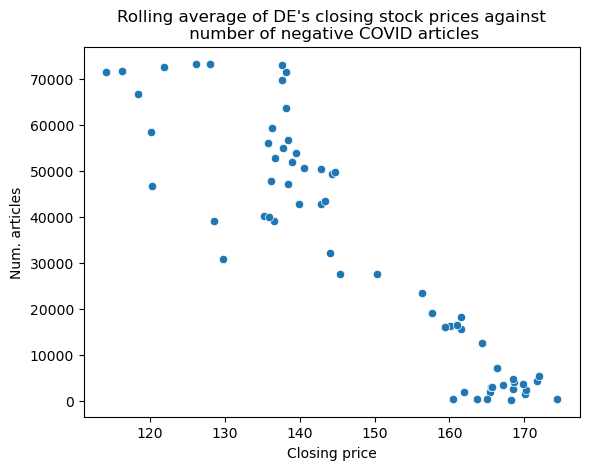

[*********************100%***********************]  1 of 1 completed

R:  -0.8579142581335619 , p-value:  2.6895838427955146e-19


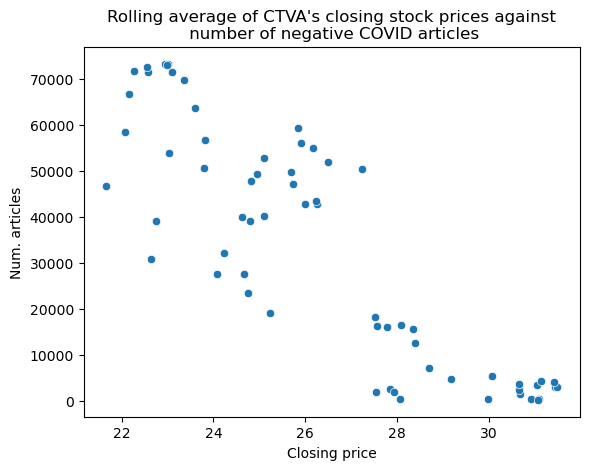

[*********************100%***********************]  1 of 1 completed


R:  -0.8939841022971766 , p-value:  6.141059780056636e-23


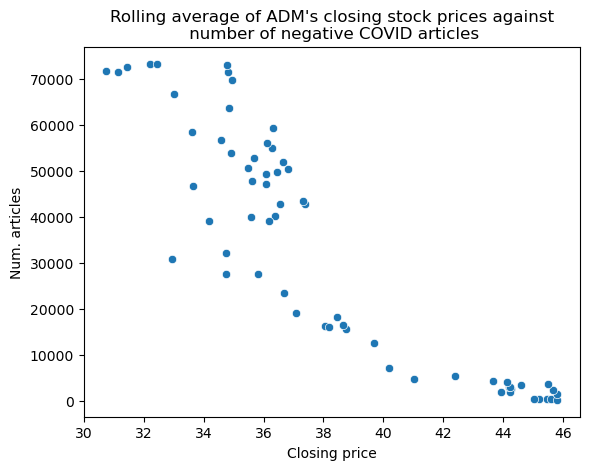

[*********************100%***********************]  1 of 1 completed

R:  -0.9592925589264136 , p-value:  3.38086676801767e-35


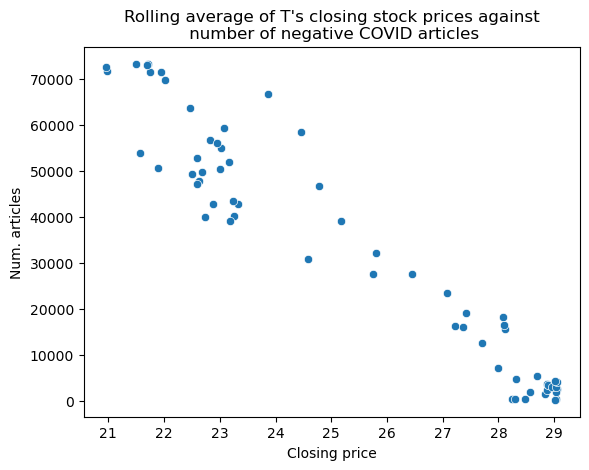

[*********************100%***********************]  1 of 1 completed

R:  -0.7132066076424943 , p-value:  5.4313415121498775e-11


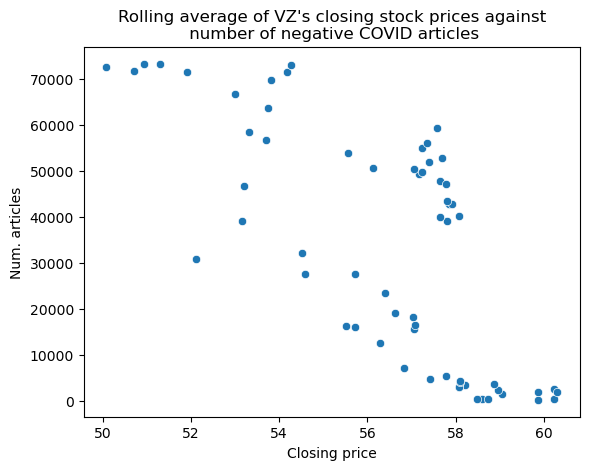

[*********************100%***********************]  1 of 1 completed


R:  -0.4811667365130884 , p-value:  6.553242378863287e-05


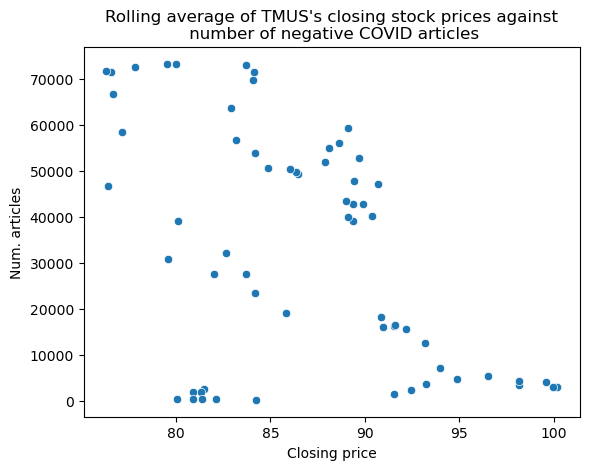

[*********************100%***********************]  1 of 1 completed

R:  -0.8783046605946374 , p-value:  3.254989569941673e-21


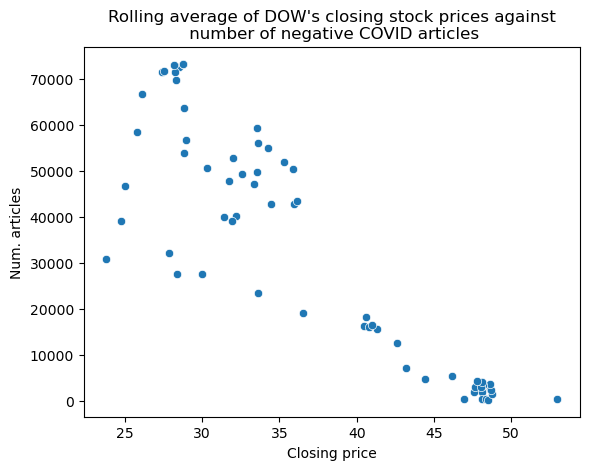

[*********************100%***********************]  1 of 1 completed

R:  0.24951787377631668 , p-value:  0.0485933470681804


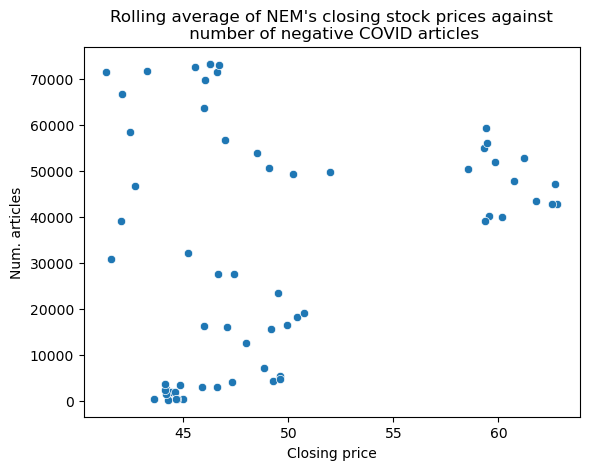

[*********************100%***********************]  1 of 1 completed

R:  -0.9375461344199955 , p-value:  1.14896181441638e-29


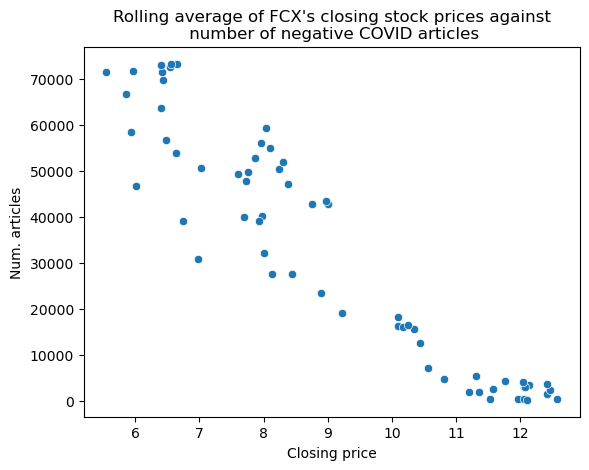

In [747]:
negavg_pctchange = covid_negavgtone_grpby_date_janapr.rolling(window='5D', min_periods=2).mean()
negavg_pctchange.to_frame()

pearson_results = []

for sector in companies:
    for stock in companies[sector]:
        df = yf.download(stock, start='2020-01-01', end='2020-05-01')
        df["Day"] = df.index
        stock_pctchange = df["Close"].rolling(window='5D', min_periods=2).mean()
        stock_pctchange.index = stock_pctchange.index.tz_localize(None)
        stock_negavg = stock_pctchange.join(negavg_pctchange)
        stock_negavg.dropna(axis=0, how='any', inplace=True)
        result = pearsonr(stock_negavg[stock], stock_negavg["NumArticles"])
        pearson_results.append((stock, result.statistic, result.pvalue))
        print("R: ", result.statistic, ", p-value: ", result.pvalue)
        sns.scatterplot(data= stock_negavg, x=stock, y="NumArticles")
        plt.ylabel("Num. articles")
        plt.xlabel("Closing price")
        plt.title(f"Rolling average of {stock}'s closing stock prices against\n number of negative COVID articles")
        plt.show()

Results of pearsonr correlation tests between rolling average of sum no. articles and stock closing prices per day.

In [765]:
pd.DataFrame(pearson_results, columns=['Stock', 'R', 'P-value']).set_index('Stock')

,R,P-value
Stock,,
AAPL,-0.903311,4.258110e-24
MSFT,-0.639060,1.735348e-08
NVDA,-0.276121,2.848544e-02
XOM,-0.918521,2.887492e-26
CVX,-0.926948,1.171168e-27
BP,-0.899571,1.280881e-23
COP,-0.919101,2.341901e-26
KO,-0.968919,1.037454e-38
PEP,-0.863450,8.710118e-20


### Q3 Conclusion

There is mostly correlation between stock prices and negative COVID articles, with a majority of the stocks having a negative correlation.

The only outlier is NEM (a gold mining company).

However, it should be noted that the stock price decreasing may also be impacted by many other factors that aren't/can't be encapsulated by the number of articles being produced on COVID.